In [1]:
import os
import numpy as np
import torch
from PIL import Image

In [2]:
from openimages.download import download_dataset
#Download 200 images from the dog class from the Google Open Source Images Project
#images and encoded annotations will be in ./data/Dog/
#segmentation masks will be found in ./data/csv/

# NOTE: This utility module did not download the segmentation mask csv. 
# This was downloaded directly from https://storage.googleapis.com/openimages/web/download.html and placed in the csv folder. We will clean it up below

# NOTE: Similar to above, we need to grab the image masks as well from the same link. 

# NOTE: We need to pull extra images since the images do not all have mask annotations. We will not be keeping all 500 images

path = os.path.join(os.getcwd(), 'data')
download_dataset(path, ['Dog'], annotation_format="darknet", limit=500, csv_dir=(path+os.sep+"csv"+os.sep))

2020-12-09  10:59:18 INFO Downloading 500 train images for class 'dog'
100%|██████████| 500/500 [00:20<00:00, 24.41it/s]
2020-12-09  10:59:38 INFO Creating 500 train annotations (darknet) for class 'dog'
100%|██████████| 500/500 [00:02<00:00, 230.20it/s]


{'dog': {'images_dir': 'c:\\Users\\Mike\\Documents\\Code\\_MEng\\611\\ml-project-mklasby\\data\\dog\\images',
  'annotations_dir': 'c:\\Users\\Mike\\Documents\\Code\\_MEng\\611\\ml-project-mklasby\\data\\dog\\darknet'}}

In [3]:
# First, we need to figure out which masks are applicable to our images: 
import pandas as pd

csv_folder = os.path.join(os.getcwd(), 'data', 'csv')
df = pd.read_csv(os.path.join(csv_folder, "train-annotations-object-segmentation.csv"))

In [4]:
# Lets filter based on the images we have avaliable:

#platform agnostic file pathing
data_folder = os.path.join(os.getcwd(), 'data')
dog_folder = os.path.join(os.getcwd(), 'data', 'dog')

imgs = [fName for fName in os.listdir(dog_folder+os.sep+"images")]
image_ids = [fName.split(".")[0] for fName in os.listdir(dog_folder+os.sep+"images")]
mask = df['ImageID'].isin(image_ids)
df = df.loc[mask]
df.sort_values("ImageID").head(10)

,MaskPath,ImageID,LabelName,BoxID,BoxXMin,BoxXMax,BoxYMin,BoxYMax,PredictedIoU,Clicks
2041622,00064d23bf997652_m0bt9lr_0c3621a5.png,00064d23bf997652,/m/0bt9lr,0c3621a5,0.240938,0.906183,0.000000,0.694286,0.90331,0.53865 0.68992 1;0.68092 0.01351 1;0.53933 0....
1246510,0012d875044bfa35_m0bt9lr_b96bb0b4.png,0012d875044bfa35,/m/0bt9lr,b96bb0b4,0.288125,0.771250,0.068889,0.854444,0.90573,0.66270 0.08739 1;0.31186 0.59770 0;0.49047 0....
76370,0014169878a84bd5_m0bt9lr_be1e4e29.png,0014169878a84bd5,/m/0bt9lr,be1e4e29,0.059375,0.888750,0.281667,0.742500,0.89142,0.86453 0.55566 1;0.08398 0.51758 1;0.55802 0....
509848,00168ee88d966565_m0bt9lr_c6ff2a19.png,00168ee88d966565,/m/0bt9lr,c6ff2a19,0.323125,0.404375,0.563333,0.756667,0.78361,0.35635 0.74819 1;0.37695 0.71766 1;0.36627 0....
1559751,00168ee88d966565_m0bt9lr_2f73718f.png,00168ee88d966565,/m/0bt9lr,2f73718f,0.495625,0.569375,0.611667,0.762500,0.91847,0.52736 0.75993 0;0.56176 0.62621 1;0.52121 0....
2074289,0016fd49ab8c05b2_m0bt9lr_8a9ecada.png,0016fd49ab8c05b2,/m/0bt9lr,8a9ecada,0.480000,0.764000,0.088456,0.308846,0.85319,0.62264 0.11889 1;0.63015 0.29903 1;0.49362 0....
1195807,001a23c9dd973787_m0bt9lr_64660786.png,001a23c9dd973787,/m/0bt9lr,64660786,0.029375,0.544375,0.122500,0.766667,0.77612,0.19477 0.67268 1;0.32341 0.73797 1;0.33301 0....
1360522,0020c297db8672b8_m0bt9lr_e7c2d1a5.png,0020c297db8672b8,/m/0bt9lr,e7c2d1a5,0.117500,0.846250,0.233918,0.903091,0.90539,0.18005 0.49844 0;0.12354 0.45144 0;0.26669 0....
608470,0033a64b441d35ac_m04yx4_dcd32489.png,0033a64b441d35ac,/m/04yx4,dcd32489,0.196875,0.375000,0.520833,0.999167,0.86279,0.32313 0.81411 0;0.34513 0.97765 0;0.25877 0....
1743451,0033a64b441d35ac_m02fq_6_764d8ca7.png,0033a64b441d35ac,/m/02fq_6,764d8ca7,0.238750,0.346875,0.516667,0.605833,0.89382,0.35127 0.57992 1;0.24514 0.60590 1;0.24844 0....


In [5]:
# We have more than 500 results since multiple objects may exist within a given image 
df.count()

MaskPath        918
ImageID         918
LabelName       918
BoxID           918
BoxXMin         918
BoxXMax         918
BoxYMin         918
BoxYMax         918
PredictedIoU    918
Clicks          918
dtype: int64

In [6]:
# Next, let's clean up the mask folder to only keep relevent files of dogs 
# NOTE: Dog class : m0bt9lr
mask_filenames = []
this_path = os.path.join(data_folder, "masks")
for filename in os.listdir(this_path):
    mask_id = filename.split("_")[0]
    class_id = filename.split("_")[1]
    if mask_id not in image_ids:
        os.remove(os.path.join(this_path, filename))
        continue
    if  class_id != "m0bt9lr":
        os.remove(os.path.join(this_path, filename))
        continue
    else: 
        #mask is good, keep it
        mask_filenames.append(filename)

In [7]:
# we are only left with 52 dogs, although some photographs contain multiple dogs! Let's see how we do with this small dataset
len(mask_filenames)

52

In [8]:
# Let's get rid of any images that we do not have a mask for: 
mask_ids = [x.split("_")[0] for x in mask_filenames]
train_ids = []
for image in image_ids:
    if(image in mask_ids):
        train_ids.append(image)
    else: 
        os.remove(os.path.join(dog_folder, "images", image+".jpg"))

In [9]:
len(train_ids) #only 37 photos remain

37

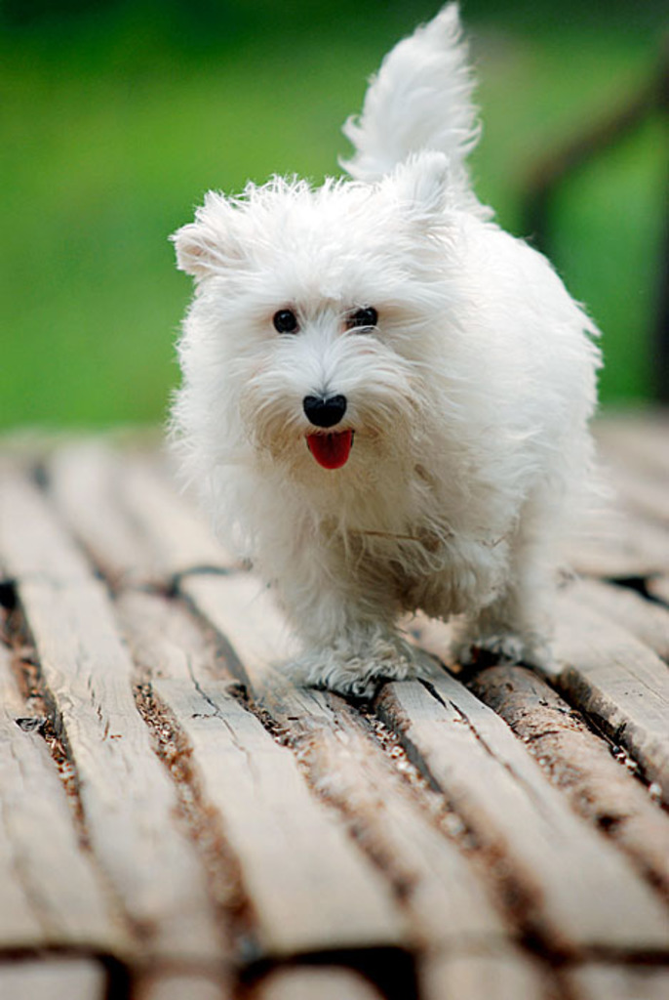

In [10]:
# Let's take a look at a few of the images and their corresponding masks: 
file_to_open = os.path.join(dog_folder, 'images', '00064d23bf997652.jpg')
Image.open(file_to_open)

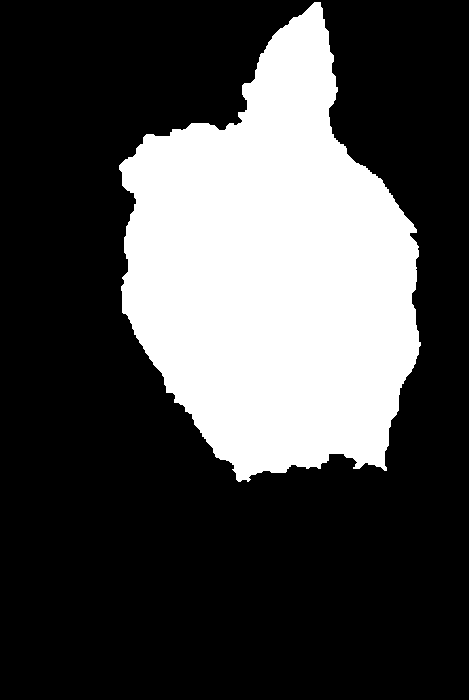

In [11]:
#Let's see how the mask looks: 
file_to_open = os.path.join(data_folder, 'masks', '00064d23bf997652_m0bt9lr_0c3621a5.png')
Image.open(file_to_open)

In [12]:
# now we need to turn our data into a dataset suitable for use with pytorch. This will be accomplished by following the tutorial provided by PyTorch @ https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html

import os
import numpy as np
import torch
from PIL import Image


class DogDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
          # Here we have revised to point to the correct folders 
          # NOTE: In our dataset, each mask instance is provided in a seperate .png file. 
          # To ensure that the masks are aligned with relevent images, each .jpg image was 
          # copied such that each mask had a correct corresponding image. 
          # These masks should ideally be combined for the best results, a future TODO. 

        self.imgs = list(sorted(os.listdir(os.path.join(root, "dog", "images"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "masks"))))

    def __getitem__(self, idx):
        # load images ad masks
        img_path = os.path.join(self.root, "dog", "images", self.imgs[idx])
        mask_path = os.path.join(self.root, "masks", self.masks[idx])

        img = Image.open(img_path).convert("RGB")
        # note that we haven't converted the mask to RGB,
        # because each tone corresponds to a different instance
        # with 0 being background and 1 being the mask in our case (white)
        mask = Image.open(mask_path)
        # convert the PIL Image into a numpy array
        # NOTE: we need to specify the dtype here so that numpy won't parse as boolean values! 
        mask = np.array(mask, dtype=int)
        # instances are encoded as different colors typically. Since we only have 1 class in our dataset, this will always be [0,1]. 
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        # TODO: This may be leading to my issues, 
        masks = mask == obj_ids[:, None, None]

        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

        # convert everything into a torch.Tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [13]:
dataset = DogDataset(data_folder)
dataset[0]

(<PIL.Image.Image image mode=RGB size=686x1024 at 0x1A0595F1B48>,
 {'boxes': tensor([[119.,   2., 420., 481.]]),
  'labels': tensor([1]),
  'masks': tensor([[[0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0],
           ...,
           [0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0],
           [0, 0, 0,  ..., 0, 0, 0]]], dtype=torch.uint8),
  'image_id': tensor([0]),
  'area': tensor([144179.]),
  'iscrowd': tensor([0])})

In the above cell, we can see the type of input that will be provided to the model. We have an image file, boxes that define the bounds of any segmentation masks, the labels (in our case, only 1 label is active, that of the dog class), a mask tensor, image_id, and the area of the image. In this example we have assumed that the iscrowd parameter is always false. 

In [14]:
torch.set_printoptions(profile="full")
print(dataset[0][1]['masks'].shape)
print(dataset[0][1]['masks'])
torch.set_printoptions(profile="default")

torch.Size([1, 700, 469])
tensor([[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
          0, 0, 0, 0, 0, 0

Getting a closer look at the mask tensor, we can see that the classes are encoded with one-hot encoding in a tensor in the shape of \[N.H,W\] where N = number of classes, H = height of image in pixels, and W = width of image in pixels. 

Therefore, the above masks tensor is a 1x700x469 tensor. We have 700 tensors, each representing 1 row of pixels. The pixels are encoded by class where the background class is 0 and the target class (dog) is 1. If we scroll down in the above, we can see some pixels become 1s where the mask is present. 

In [15]:
# Since training a CNN from scratch is very time consuming, we will select one of the pre-trained models to start from and simply re-train the last layer of the neural net. 

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
 
# load a model pre-trained pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
 
# replace the classifier with a new one, that has
# num_classes which is user-defined
num_classes = 2  # 1 class (doggo) + background
# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features
# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes) 

In [16]:
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
 
# load a pre-trained model for classification and return
# only the features
backbone = torchvision.models.mobilenet_v2(pretrained=True).features
# FasterRCNN needs to know the number of
# output channels in a backbone. For mobilenet_v2, it's 1280
# so we need to add it here
backbone.out_channels = 1280
 
# let's make the RPN generate 5 x 3 anchors per spatial
# location, with 5 different sizes and 3 different aspect
# ratios. We have a Tuple[Tuple[int]] because each feature
# map could potentially have different sizes and
# aspect ratios 
anchor_generator = AnchorGenerator(sizes=((32, 64, 128, 256, 512),),
                                   aspect_ratios=((0.5, 1.0, 2.0),))
 
# let's define what are the feature maps that we will
# use to perform the region of interest cropping, as well as
# the size of the crop after rescaling.
# if your backbone returns a Tensor, featmap_names is expected to
# be [0]. More generally, the backbone should return an
# OrderedDict[Tensor], and in featmap_names you can choose which
# feature maps to use.
roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=[0],
                                                output_size=7,
                                                sampling_ratio=2)
 
# put the pieces together inside a FasterRCNN model
model = FasterRCNN(backbone,
                   num_classes=2,
                   rpn_anchor_generator=anchor_generator,
                   box_roi_pool=roi_pooler)

In [17]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

      
def get_instance_segmentation_model(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)
    return model

In [18]:
from engine import train_one_epoch, evaluate
import utils
import transforms as T

# Generally, it is a good idea to augment the training images by randomly rotating, flipping, or mirroring the data. This will help the model adapt to objects that are not oriented in a typical fashion (eg., dog laying on its back upside down)

def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    transforms.append(T.ToTensor())
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(T.RandomHorizontalFlip(0.5))
    return T.Compose(transforms)

In [19]:
# use our dataset and defined transformations
dataset = DogDataset(data_folder, get_transform(train=True))
dataset_test = DogDataset(data_folder, get_transform(train=False))

# split the dataset in train and test set
torch.manual_seed(1)
indices = torch.randperm(len(dataset)).tolist()
# With our limited data, we will manually encode a 90/10 training/test split. 
dataset = torch.utils.data.Subset(dataset, indices[:33])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-4:])

# define training and validation data loaders
# NOTE: We must set the num_workers parameter to 0 to avoid an out of memory issue in my GPU. Your mileage may vary. 
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=2, shuffle=True, num_workers=0,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=1, shuffle=False, num_workers=0,
    collate_fn=utils.collate_fn)

In [20]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# our dataset has two classes only - background and dog
num_classes = 2

# get the model using our helper function
model = get_instance_segmentation_model(num_classes)
# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005,
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

In [21]:
# let's train it for 10 epochs. This means that we will parse through the whole dataset 10 times. 
# NOTE: This will take up to 20 mins on CPU only. Only about 1-2mins for a decnet GPU. 
num_epochs = 10

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)

Epoch: [0]  [ 0/17]  eta: 0:00:33  lr: 0.000317  loss: 3.2144 (3.2144)  loss_classifier: 0.6547 (0.6547)  loss_box_reg: 0.0109 (0.0109)  loss_mask: 2.3830 (2.3830)  loss_objectness: 0.1585 (0.1585)  loss_rpn_box_reg: 0.0073 (0.0073)  time: 1.9543  data: 0.0761  max mem: 2655
Epoch: [0]  [10/17]  eta: 0:00:04  lr: 0.003439  loss: 1.8474 (2.1759)  loss_classifier: 0.0873 (0.2257)  loss_box_reg: 0.0109 (0.0144)  loss_mask: 1.6150 (1.7840)  loss_objectness: 0.0819 (0.1158)  loss_rpn_box_reg: 0.0091 (0.0359)  time: 0.6602  data: 0.0956  max mem: 3737
Epoch: [0]  [16/17]  eta: 0:00:00  lr: 0.005000  loss: 1.6766 (2.9269)  loss_classifier: 0.0327 (0.1568)  loss_box_reg: 0.0083 (0.0122)  loss_mask: 0.8996 (1.3895)  loss_objectness: 0.0936 (0.3868)  loss_rpn_box_reg: 0.0098 (0.9816)  time: 0.5796  data: 0.0922  max mem: 3737
Epoch: [0] Total time: 0:00:09 (0.5797 s / it)
creating index...
index created!
Test:  [0/4]  eta: 0:00:00  model_time: 0.0891 (0.0891)  evaluator_time: 0.0010 (0.0010)  ti

In the above cell, we see the output of the training printed once per 10 iterations. While the loss function appears to be showing improvements, the real story is told directly by the precision outputs. We are seeing 0 precision! As we will see below, there is a serious error in the model's predictions. The loss function improvements can be seen by comparing the iteration outputs where loss metricss are printed. 

Precision in this case is given by the Intersection-over-Union IoU measure, which is commonly used to evalute segmentation tasks. In this particular case, the IoU is averaged based on 0.05 threshold increments from \[0.5 to 0.95\]. 

In [22]:
# Lets try some images from the test set
# pick one image from the test set
img, _ = dataset_test[0]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

In [23]:
prediction

[{'boxes': tensor([[ 442.5206,  351.5715,  898.5750,  768.0000],
          [   5.6044,  366.8411,  496.0615,  768.0000],
          [ 109.6611,  478.1557,  936.1716,  768.0000],
          [ 594.1310,  300.1734, 1023.6278,  768.0000],
          [ 210.2179,    0.0000, 1021.7679,  768.0000],
          [  11.7923,    0.0000,  675.4782,  724.2505],
          [ 407.8310,  168.8566,  743.0063,  768.0000],
          [   5.4272,   64.1587,  314.3937,  688.8151],
          [ 277.9511,  167.3345,  620.0693,  768.0000],
          [  75.1374,  315.4588,  851.7321,  713.2095],
          [ 159.6206,    0.0000,  500.5338,  630.4849],
          [ 649.4338,   59.0653,  991.8654,  675.9360],
          [ 526.2731,    0.0000,  871.8275,  560.2938]], device='cuda:0'),
  'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'),
  'scores': tensor([0.0876, 0.0857, 0.0851, 0.0830, 0.0814, 0.0727, 0.0650, 0.0649, 0.0630,
          0.0613, 0.0565, 0.0541, 0.0509], device='cuda:0'),
  'masks': te

In the above, we can already see that we have a major issue in the results. The mask bounding boxes are shown in the 'boxes' value aboive. The model has predicted 13 dogs in the below image! See `ProjecReadme.md` for more discussion on results. 

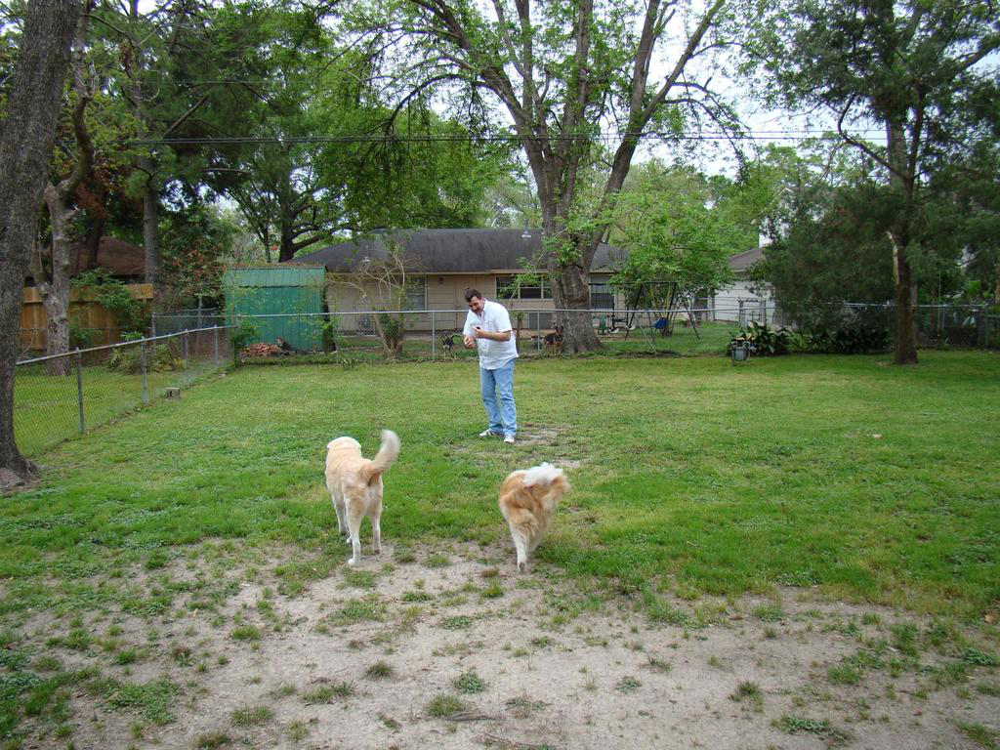

In [24]:
Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())

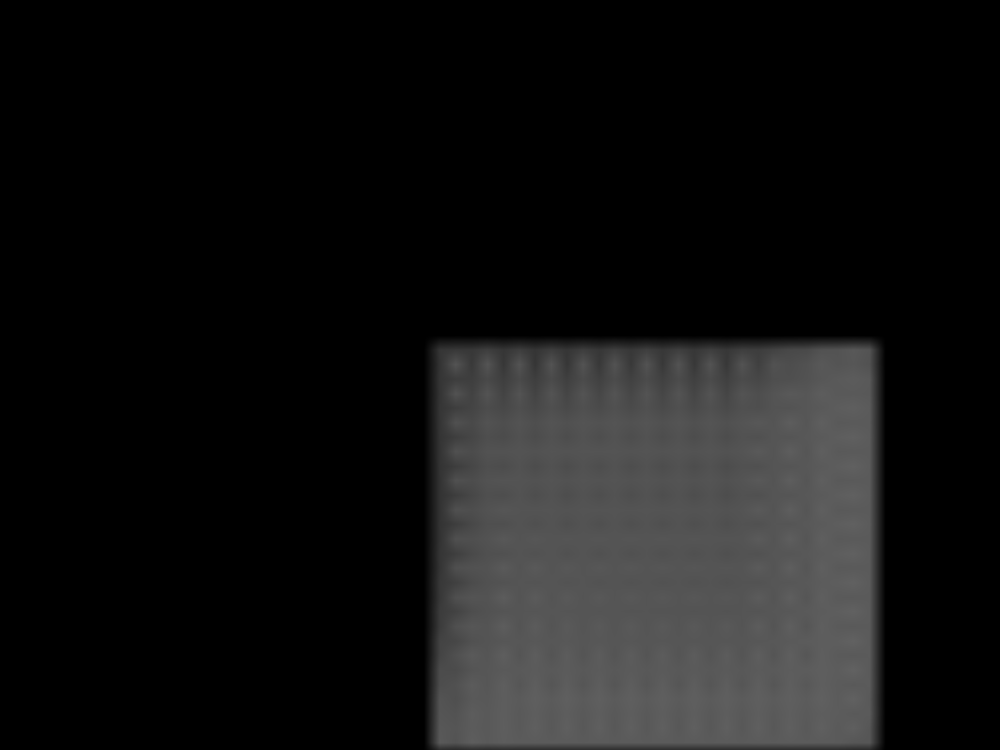

In [25]:
Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())

Here we see the malformed mask. Doesn't look like any dogs I know!

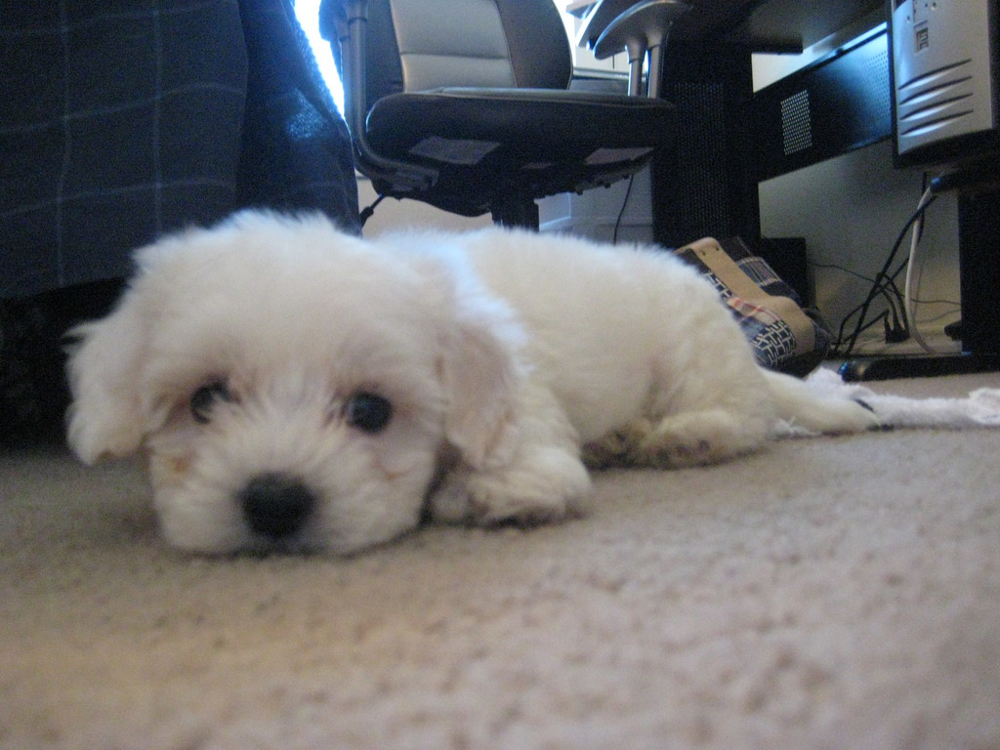

In [26]:
# Lets try a different test image
img, _ = dataset_test[1]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())


In [27]:
prediction

[{'boxes': tensor([[ 487.2675,  343.0519,  974.7067,  768.0000],
          [ 427.6444,    0.0000, 1022.9627,  768.0000],
          [ 232.0028,  399.0659,  734.6660,  768.0000],
          [  13.9921,   54.4820,  845.6636,  768.0000],
          [ 109.4393,  536.9968,  918.9474,  768.0000],
          [  88.0391,  341.7084,  583.7687,  768.0000],
          [ 403.9272,  193.6333,  742.8618,  768.0000],
          [   7.4889,    0.0000,  439.9188,  693.2401],
          [ 713.8327,  125.6774, 1023.2252,  751.2148],
          [ 283.1856,  127.0997,  619.8129,  725.1419],
          [ 464.8483,   62.0016,  804.8143,  678.1143],
          [ 590.4419,   56.2616,  924.4112,  671.5483],
          [ 162.4187,    0.0000,  494.5070,  555.8887],
          [ 286.9844,   74.5755,  741.4772,  527.9148],
          [ 138.3982,  257.0683,  924.7843,  663.6547],
          [  10.5272,   81.9021,  617.5227,  483.0276]], device='cuda:0'),
  'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device=

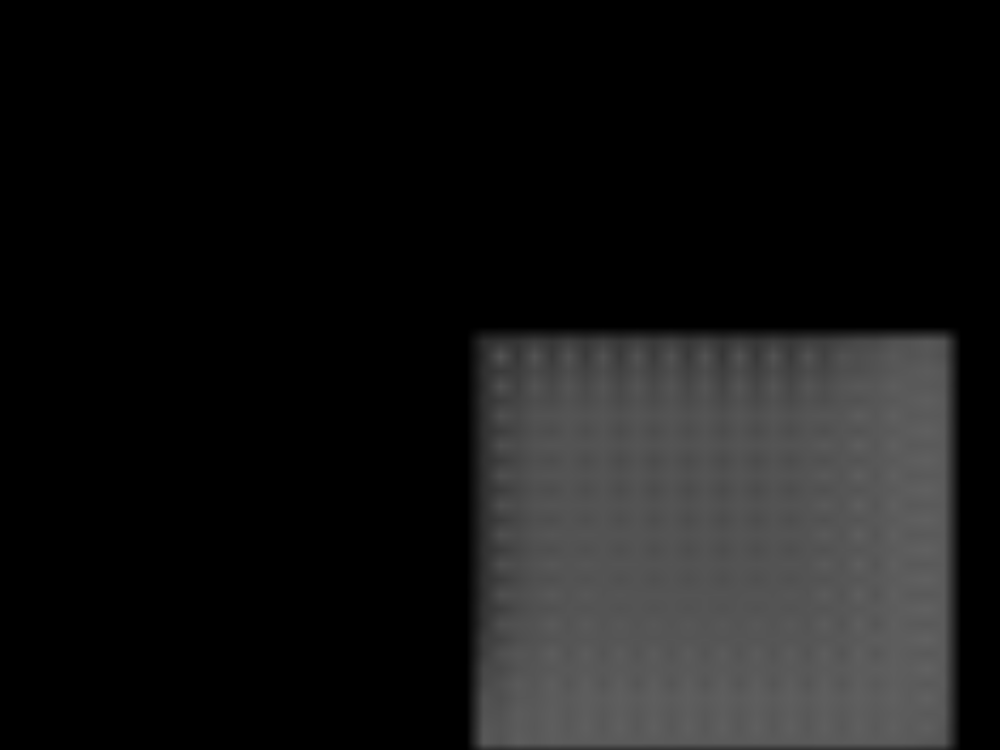

In [28]:
Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())

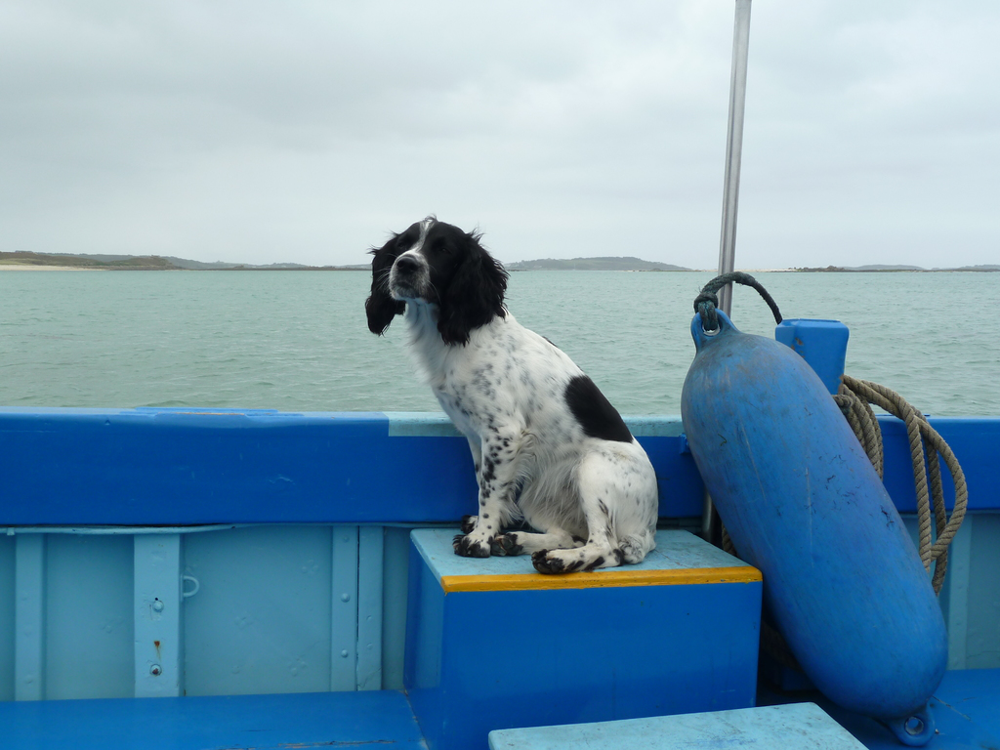

In [37]:
   # pick one image from the test set
img, _ = dataset_test[2]
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())

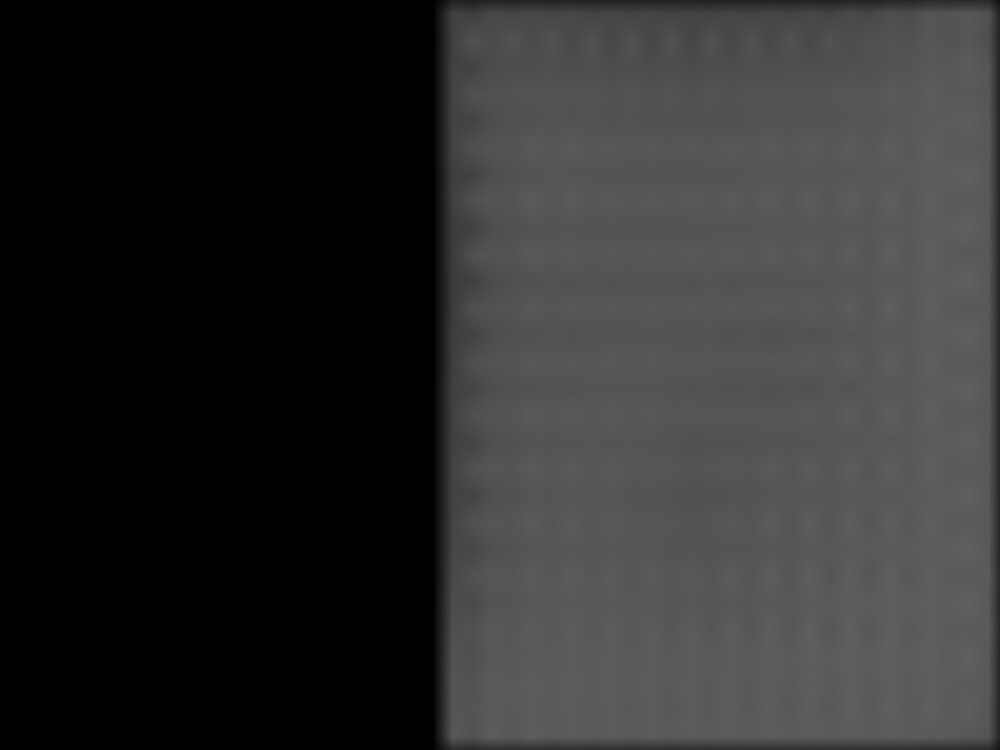

In [38]:
Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())

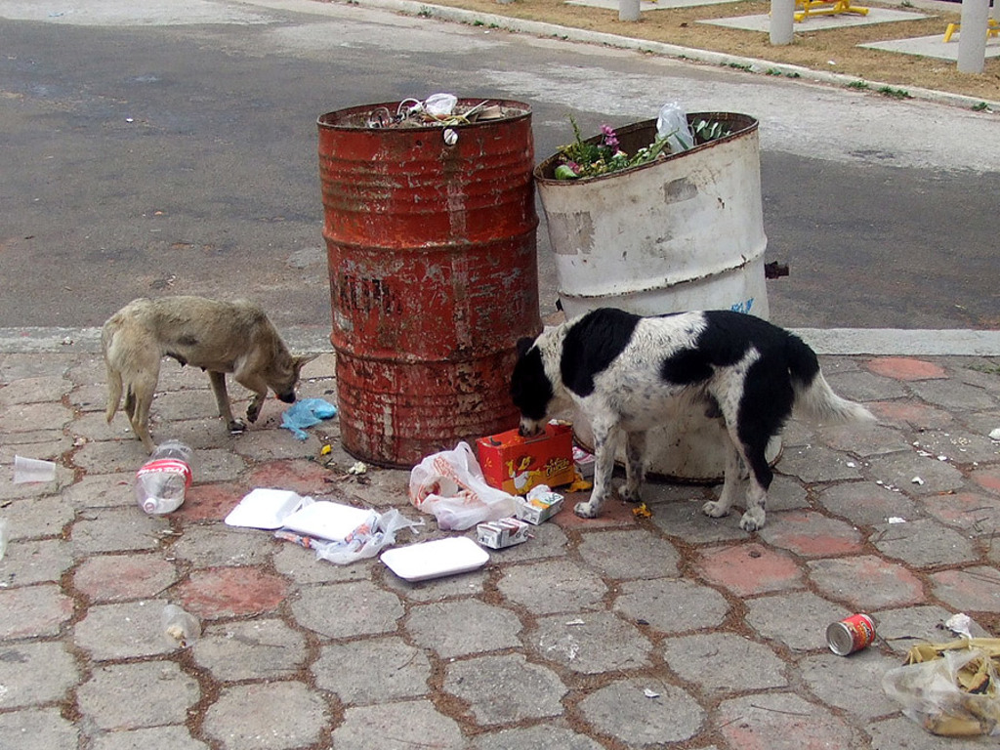

In [39]:
   # pick one image from the test set
img, _ = dataset_test[3]
img
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())

In [40]:
prediction

[{'boxes': tensor([[   7.8419,    0.0000,  578.6212,  768.0000],
          [ 220.4547,   11.1862,  558.5206,  618.2337],
          [ 367.8722,  377.3340,  841.7386,  768.0000],
          [ 108.0956,  478.5151,  924.9376,  768.0000],
          [ 515.2728,  342.1292, 1003.8317,  768.0000],
          [ 411.3932,    0.0000, 1021.5096,  768.0000],
          [ 157.9933,  219.8296,  504.6940,  768.0000],
          [  30.4320,  230.2763,  381.3078,  768.0000],
          [ 276.4478,  220.0563,  629.0938,  768.0000],
          [ 337.6493,    4.0800,  682.2491,  628.2842],
          [  95.2918,   56.2214,  436.9289,  677.8710],
          [  60.9615,    0.0000,  905.1123,  594.2641],
          [  10.2112,   78.2915,  672.4528,  483.4930],
          [ 463.3800,   10.4111,  803.9710,  619.8602],
          [ 524.6927,  117.8140,  871.2589,  737.7433],
          [ 251.0151,  138.6697, 1019.6116,  541.7681],
          [ 646.5966,   49.4054,  991.1514,  687.5075],
          [  68.5823,  253.7645,  849.9

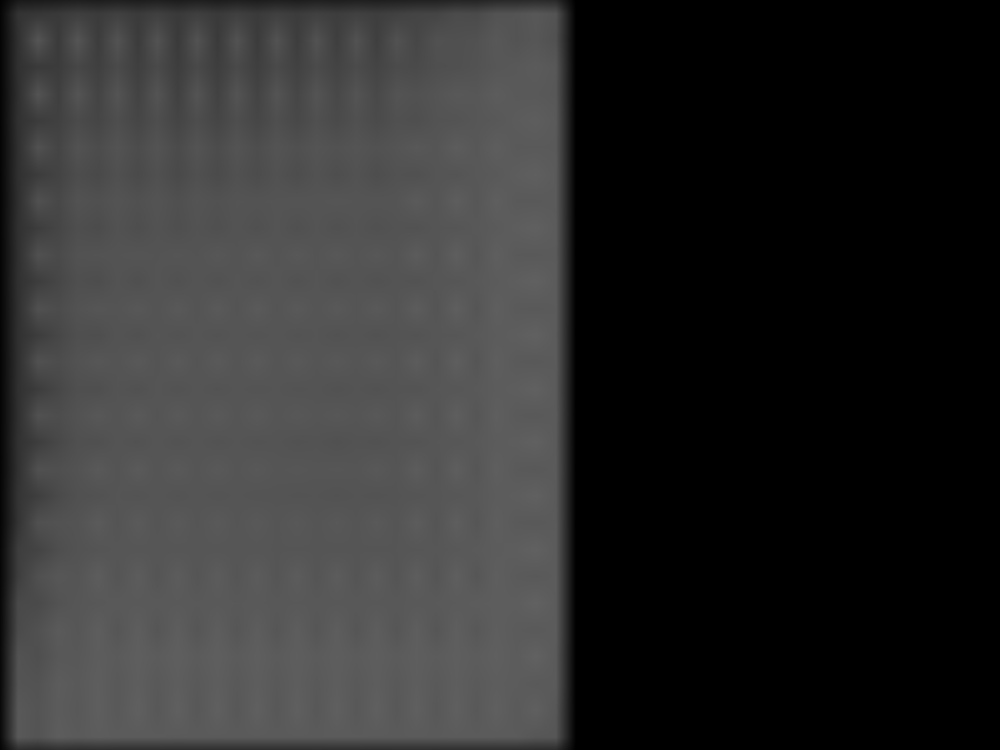

In [41]:
Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())

torch.Size([3, 1024, 1024])


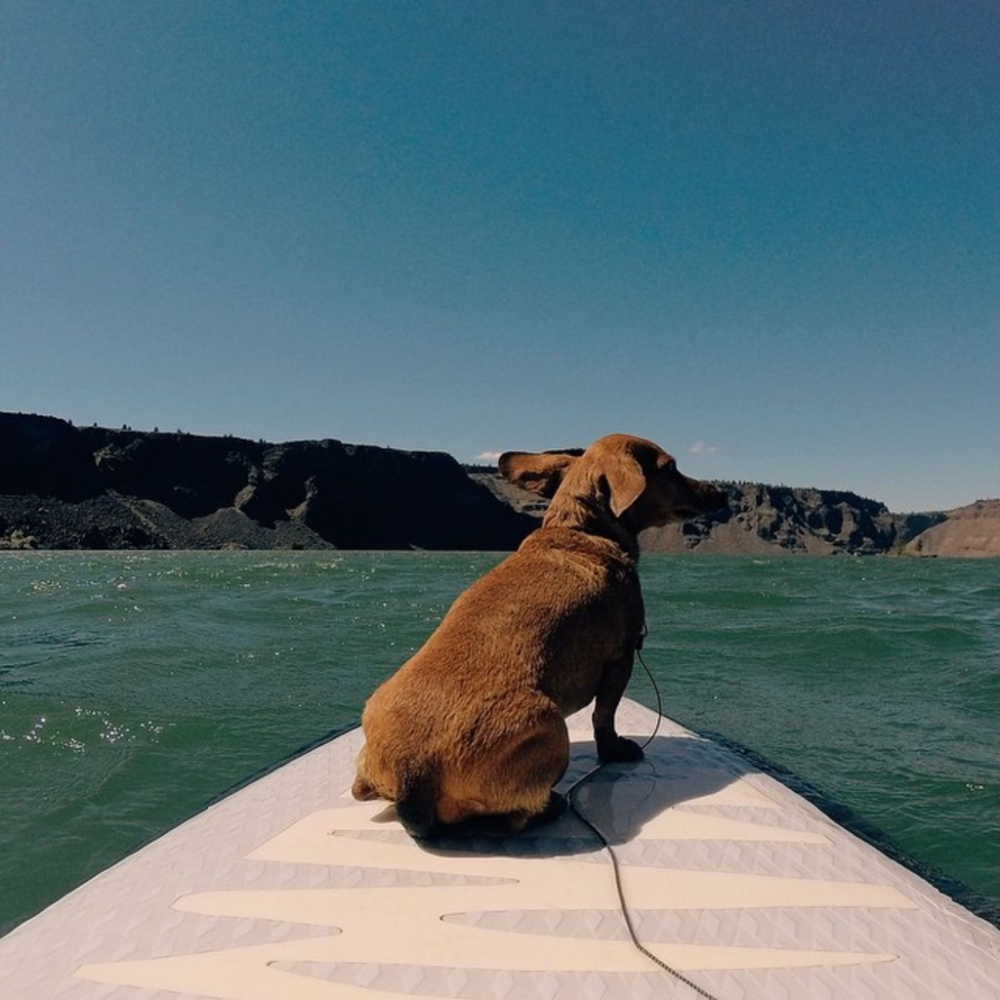

In [33]:
# pick one image from the training set to see if we have any better luck: 
img, _ = dataset[0]
print(img.shape)
# put the model in evaluation mode
model.eval()
with torch.no_grad():
    prediction = model([img.to(device)])

Image.fromarray(img.mul(255).permute(1, 2, 0).byte().numpy())

In [34]:
prediction

[{'boxes': tensor([[   7.0031,  484.5206,  660.4725, 1024.0000],
          [ 257.0370,  423.6662,  874.9434, 1024.0000],
          [   9.6446,    0.0000,  644.4260,  884.7331],
          [ 427.4781,    0.0000,  881.8961,  822.6326],
          [ 127.6174,    0.0000,  767.8626,  554.3163],
          [ 273.6097,   54.9107,  729.1141,  919.4703],
          [ 446.1820,  295.6615, 1022.0386,  915.7398],
          [   9.6329,  257.5068,  895.0931,  799.0764]], device='cuda:0'),
  'labels': tensor([1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0'),
  'scores': tensor([0.0923, 0.0761, 0.0719, 0.0646, 0.0593, 0.0591, 0.0526, 0.0522],
         device='cuda:0'),
  'masks': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
            [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
            [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
            ...,
            [0.0482, 0.0582, 0.0682,  ..., 0.0000, 0.0000, 0.0000],
            [0.0445, 0.0537, 0.0629,  ..., 0.0000, 

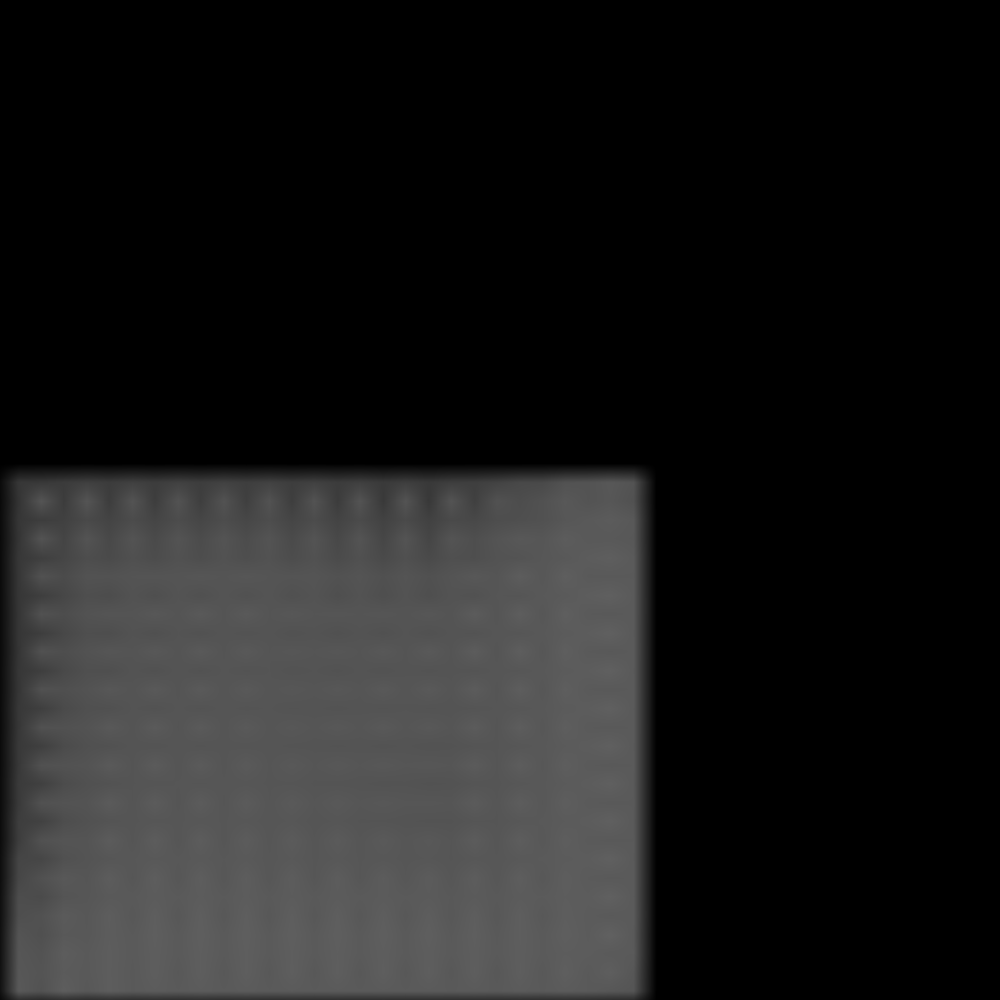

In [35]:
Image.fromarray(prediction[0]['masks'][0, 0].mul(255).byte().cpu().numpy())

Still not working! Looks like we have a major problem in the preparation of our custom dataset!